
**AIcrowd Mapping Challenge**  
_Description:_ https://www.aicrowd.com/challenges/mapping-challenge


_Simone Vaccari_   


In [ ]:
import numpy as np
import json
import pandas as pd
import os
import random
import cv2
from PIL import Image
from tqdm.auto import tqdm
import time
import math

import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import Rectangle

import skimage as ski
# from skimage.color import label2rgb
from skimage.io import imread
from skimage import io

from sklearn.model_selection import train_test_split

# Pytorch
try:
  import segmentation_models_pytorch as smp
except ModuleNotFoundError:
  !pip install segmentation_models_pytorch
  import segmentation_models_pytorch as smp

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.nn.parameter import Parameter
from torch.utils.data import DataLoader, Dataset

from torchvision.io import read_image
import torchvision.models as models
from torchvision import transforms
from torchvision.transforms import functional as FUNC

try:
  from torchsummary import summary
except ModuleNotFoundError:
  !pip install torchsummary
  from torchsummary import summary

import albumentations as A
from albumentations.pytorch import ToTensorV2


In [ ]:
# RUN THIS CELL ONLY IF WORKING ON COLAB
from google.colab import drive
drive.mount("/content/drive/")

## Download dataset

CHANGE PATH TO YOUR DIRECTORY CONTAINING mappingDataset.tar

In [ ]:
# Extract the tar file (saves it in the notebook file space) --> this takes about 20 seconds
!tar xf '/content/drive/MyDrive/ACT/mappingDataset.tar'     # COLAB
# !tar xf '/kaggle/input/mappingdataset/0a5c561f-e361-4e9b-a3e2-94f42a003a2b_val.tar'   # KAGGLE

## Support functions

In [ ]:
'''
Convert annotations to segmentation mask
'''
def create_mask(df,img_id,ax):
  # Filter annotations for the given image id
  annotations = df[df['image_id'] == img_id]

  mask = np.zeros((300, 300))

  # Iterate over annotations and draw segmentation masks
  for _, annot in annotations.iterrows():
    xy_vec = np.array(annot['segmentation']).reshape((-1, 2))
    ax.plot(xy_vec[:, 0], xy_vec[:, 1], label = df['id_x'], lw=2)
    mask = cv2.fillPoly(mask, [xy_vec.astype(np.int32)], color=1)

  return mask.astype(np.float32)


'''
Plot histogram of buildings distribution
'''
def count_buildings(df, set_name):
  value_counts = df["image_id"].value_counts()

  plt.figure(figsize=(10, 8))
  plt.hist(value_counts, bins=range(1, value_counts.max() + 2), edgecolor='black', align='left')
  plt.title(f'Histogram of building counts in the {set_name} dataset')
  plt.xlabel('Number of buildings')
  plt.ylabel('Frequency')
  plt.xticks(range(1, value_counts.max() + 1))
  # plt.savefig(f"building_counts_{set_name}")
  plt.show()


"""
Visualize image and mask of specific id
"""
def visualize_img_from_id(df, id, dir):
  filename = df[df["image_id"]== id]["file_name"].values[0]
  img = imread(os.path.join(dir,filename))

  fig,axes = plt.subplots(1,3,figsize=(10,6))
  axes[0].imshow(img)
  axes[0].set_title("Original Image")
  axes[0].axis('off')

  mask = create_mask(df, id, axes[1])
  axes[1].imshow(mask)
  axes[1].set_title("Segmented Mask")
  axes[1].axis('off')

  axes[2].imshow(img)
  axes[2].imshow(mask, cmap='jet', alpha=0.3)
  axes[2].set_title("Mask over Image")
  axes[2].axis('off')


'''
Visualize a batch of images with the corresponding gt masks
'''
def visualize_batch(loader):
    images, masks = next(iter(loader))

    fig, axes = plt.subplots(len(images), 2, figsize=(12, len(images) * 3))

    for i in range(len(images)):
        img = images[i].permute(1, 2, 0).numpy()
        mask = masks[i].squeeze().numpy()

        axes[i, 0].imshow(img)
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()


## Data processing and visualization

In [ ]:
base_dir = 'val/'  # '/kaggle/working/val/'
img_dir = 'val/images/'  # '/kaggle/working/val/images/'

# Load annotations
json_path = os.path.join(base_dir, 'annotation.json')
with open(json_path, 'r') as f:
    annot_data = json.load(f)

_annot\_data_ is a dictionary that contains:
- '**info**': info about the dataset creator, year of creation, etc..
- '**categories**': categories of the subjects. In this case just 'building'
- '**images**': list of dicts with images ids, file_names, width (300), and height (300)
- '**annotations**': list of dicts with actual annotations for the images

as explained in https://github.com/crowdAI/mapping-challenge-starter-kit/blob/master/Dataset%20Utils.ipynb

We first separate the data related to the images from the data with the annotations.  

_image\_df_  has 4 columns:
- '**id**' of the image
- '**file_name**' of the corresponding image
- '**width**' of the image
- '**height**' of the image

Since all images have size 300x300 we decide to drop the columns 'width' and 'height'.

          id         file_name
3425    9930  000000009930.jpg
36645  15117  000000015117.jpg
46938  34742  000000034742.jpg


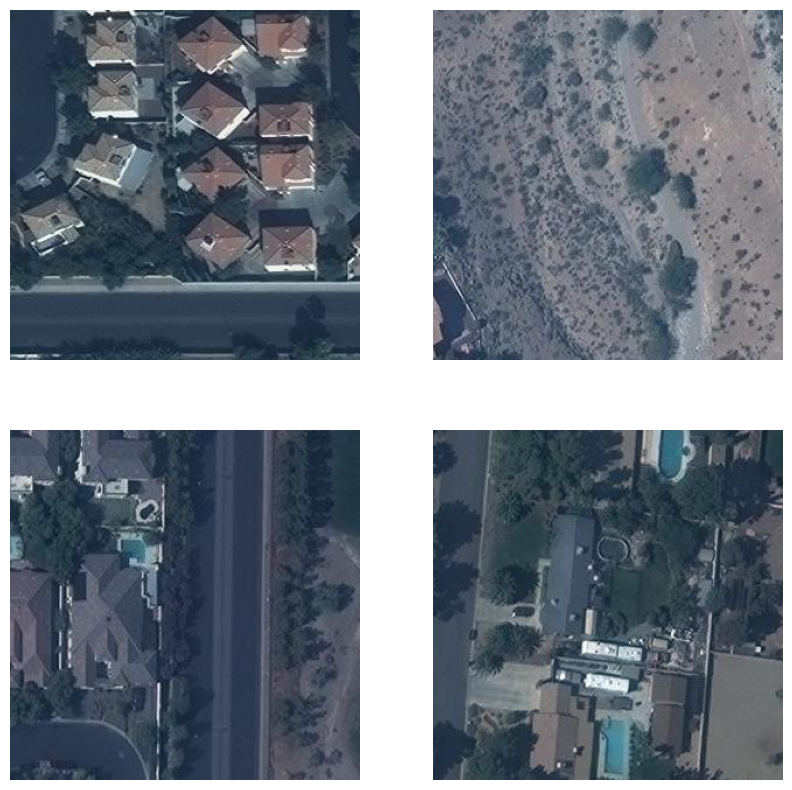

In [ ]:
# Create a dataframe with the images ids and file_names
image_df = pd.DataFrame(annot_data['images']).drop(["width", "height"], axis=1)

# Visualize some images (read the file name from image_df and find the corresponding image in the 'images' directory)
print(image_df.sample(3))
fig, axes = plt.subplots(2, 2, figsize = (10, 10))
for ax, (_, row) in zip(axes.flatten(), image_df.sample(4).iterrows()):
  img_data = imread(os.path.join(img_dir, row['file_name']))
  ax.axis('off')
  ax.imshow(img_data)

In [ ]:
# Check for NaN values
image_df.isna().sum()

id           0
file_name    0
dtype: int64

_annot\_df_ has 7 columns:
- '**id**': a unique id for the annotation
- '**image_id**': a unique id for the referenced image
- '**segmentation**': annotation markers. It can be in 2 forms:
  - poly: list of coordinates in the form [x1,y1,x2,y2,x3,y3,x4,y4,...]
  - rle: run length encoding of the same information
- '**area**': total pixel area of the said annotation
- '**bbox**': bounding box for the annotation as [X, Y, W, H], where X and Y are coordinates of the top-left corner, W is the width, and H the height
- '**category_id**': category id of the particular annotation. In this case it's always 100, representing 'Building'
- '**is_crowd**': boolean value which communicates if this annotation is a single annotation for a group of individual objects. In this dataset, this is always marked as False

Since they don't provide any important information we decide to drop the last 2 variables.

In [ ]:
# Create annotations dataframe and drop unnecessary columns
annot_df = pd.DataFrame(annot_data['annotations']).drop(["category_id", "iscrowd"],axis=1)
annot_df.sample(3)

,id,image_id,segmentation,area,bbox
345800,515065,60280,"[[262.0, 133.0, 299.0, 133.0, 299.0, 278.0, 29...",3002.0,"[133.0, 262.0, 166.0, 37.0]"
214626,483926,56570,"[[238, 140, 238, 147, 271, 147, 272, 198, 204,...",3681.0,"[140, 204, 132, 68]"
398062,352692,41347,"[[103, 70, 120, 121, 96, 126, 93, 116, 88, 117...",3361.0,"[70, 45, 67, 75]"


In [ ]:
annot_df.shape

(515364, 5)

In [ ]:
# This was run once just to check that all 'segmentation' are in the 'poly' type (not 'rle')
"""
for index, row in annot_df.iterrows():
  if type(row["segmentation"][0]) != list:
    print(f"NOT LIST {index}")
"""

In [ ]:
# Check for NaN values
annot_df.isna().sum()

id              0
image_id        0
segmentation    0
area            0
bbox            0
dtype: int64

In [ ]:
# Merge the 2 dataframes
full_df = pd.merge(annot_df, image_df, how='left', left_on = 'image_id', right_on='id')
print("Shape: ", full_df.shape)
full_df.sample(2)

Shape:  (515364, 7)


,id_x,image_id,segmentation,area,bbox,id_y,file_name
302135,232587,27258,"[[194.0, 35.0, 151.0, 30.0, 153.0, 0.999999999...",1433.0,"[0.9999999999999998, 151.0, 193.0, 54.0]",27258,000000027258.jpg
439954,7094,821,"[[290, 69, 290, 125, 267, 125, 267, 124, 244, ...",2553.0,"[69, 244, 221, 46]",821,000000000821.jpg


In [ ]:
# Check for NaN values
full_df.isna().sum()

id_x            0
image_id        0
segmentation    0
area            0
bbox            0
id_y            0
file_name       0
dtype: int64

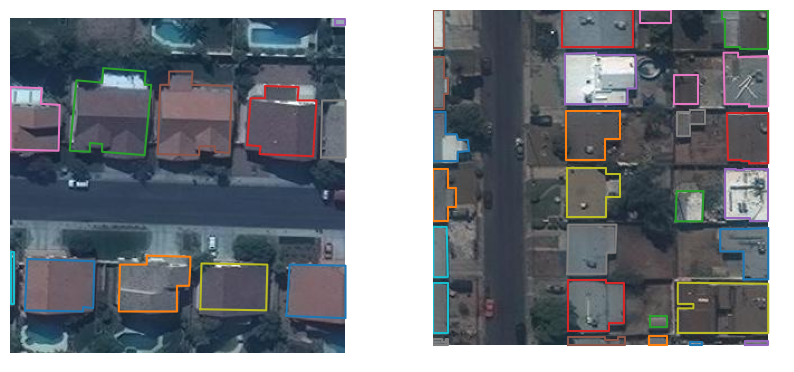

In [ ]:
# Visualize images with bounding polygons
fig, axes = plt.subplots(1, 2, figsize = (10, 10))
for ax, (im_id, c_df) in zip(axes.flatten(), full_df.groupby('image_id')):
  img_data = imread(os.path.join(img_dir, c_df['file_name'].values[0]))
  ax.imshow(img_data)
  ax.axis('off')
  for _, row in c_df.iterrows():
    xy_vec = np.array(row['segmentation']).reshape((-1, 2))  # matrix of coordinates for the polygons
    ax.plot(xy_vec[:, 0], xy_vec[:, 1])

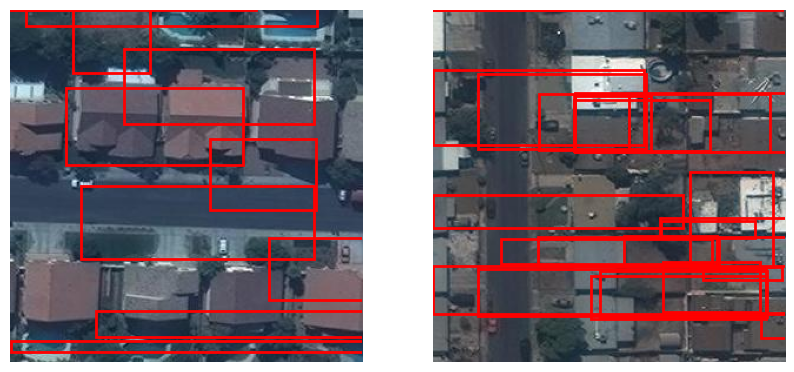

In [ ]:
# Visualize images with bounding boxes
fig, axes = plt.subplots(1, 2, figsize = (10, 10))
for ax, (im_id, c_df) in zip(axes.flatten(), full_df.groupby('image_id')):
  img_data = imread(os.path.join(img_dir, c_df['file_name'].values[0]))
  ax.imshow(img_data)
  ax.axis('off')
  for _, row in c_df.iterrows():
    bbox_coord = np.array(row['bbox'])
    # print(bbox_coord)
    # create a Rectangle patch
    rect = Rectangle(
        (bbox_coord[0], bbox_coord[1]-bbox_coord[3]),  # (x, y) # y-height since matplotlib Rectangle starts from bottom left corner
        bbox_coord[2],                   # width
        bbox_coord[3],                   # height
        linewidth=2,
        edgecolor='r',
        facecolor='none'
    )
    # add the patch to the Axes
    ax.add_patch(rect)

It seems like the information in the bbox is incorrect. If we try and print some values we see that we have negative x and y coordinates, and widths larger than 300.

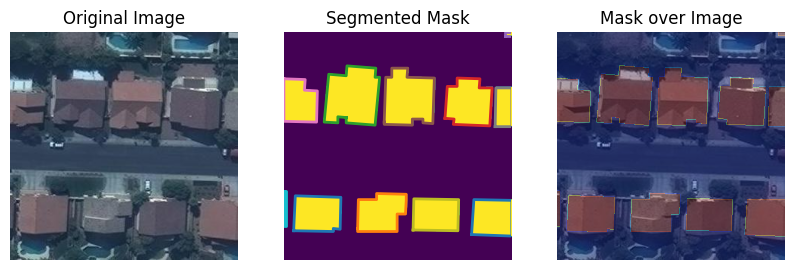

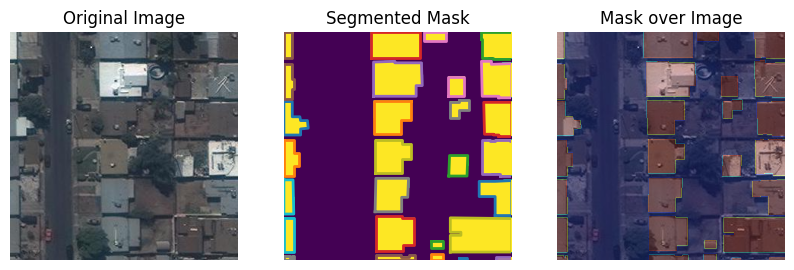

In [ ]:
# Let's visualize some masks
for i, (c_id, c_df) in enumerate(full_df.groupby('image_id')):
  if i>1:
    break
  visualize_img_from_id(c_df, c_id, img_dir)

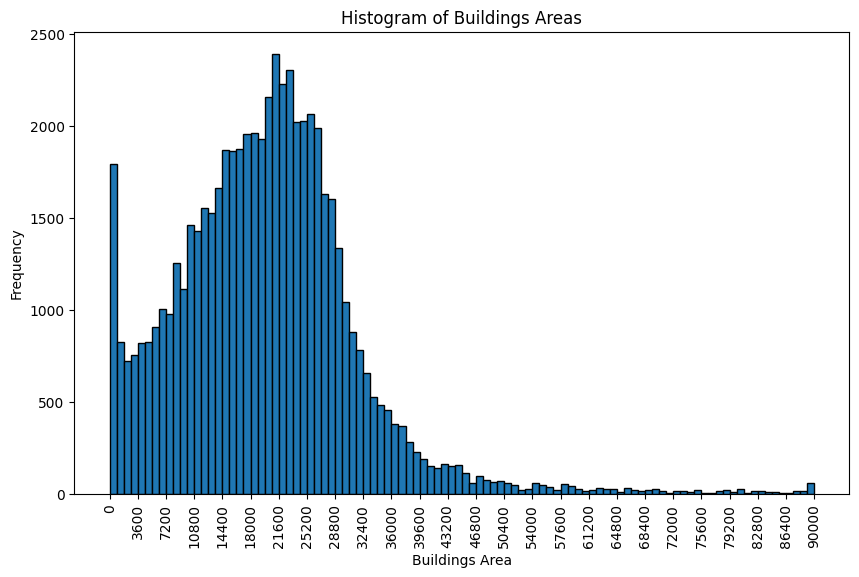

In [ ]:
# Histogram of buildings area in the image
buildings_areas = full_df.groupby('image_id')['area'].sum()

plt.figure(figsize=(10, 6))
_, bins, counts = plt.hist(buildings_areas, bins=100, edgecolor='black')
plt.xlabel('Buildings Area')
plt.ylabel('Frequency')
tick_positions = bins[::4]
tick_labels = [f'{int(bin_edge)}' for bin_edge in tick_positions]
plt.xticks(tick_positions, tick_labels, rotation=90)
plt.title('Histogram of Buildings Areas')
plt.show()



It looks like most of the masks have a a total foreground pixel area lower than 36,000, with a high majority ranging between 20,000 and 24,000, corresponding to about 25% of the area of the whole image. There is also a good amount of images with a very small number of foreground pixels, let's visualize some.

There are 31 empty masks in the dataset


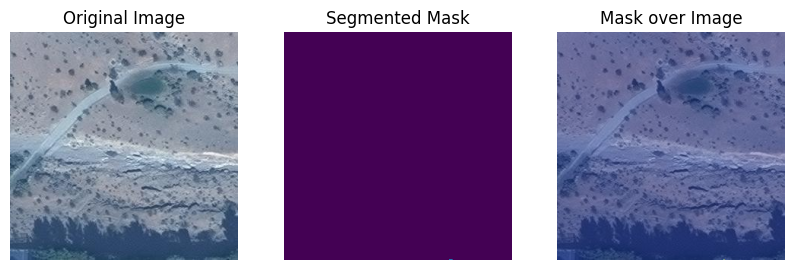

In [ ]:
# Let's check if there is empty masks and visualize one
empty_masks_idxs = [i for i,val in enumerate(buildings_areas.values) if val==0.]

if len(empty_masks_idxs) > 0:
  print(f"There are {len(empty_masks_idxs)} empty masks in the dataset")
  visualize_img_from_id(full_df, empty_masks_idxs[0], img_dir)

There are 57 masks in the dataset with 99% of foreground pixels


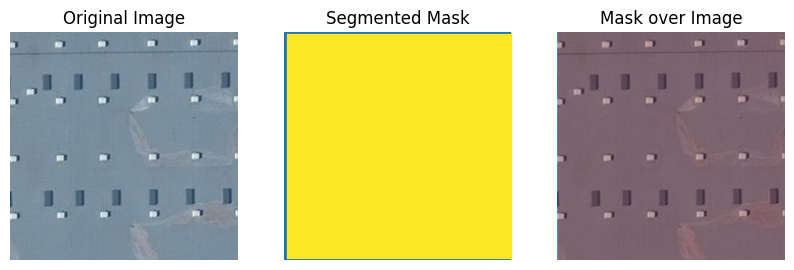

In [ ]:
# Let's check if there is very full masks and visualize one
big_masks_idxs = [i for i,val in enumerate(buildings_areas.values) if val>=89000]

if len(big_masks_idxs) > 0:
  print(f"There are {len(big_masks_idxs)} masks in the dataset with 99% of foreground pixels")
  visualize_img_from_id(full_df, big_masks_idxs[0], img_dir)

It is not clear whether they are mislabeled data or very close images of roofs. Let's remove them.

In [ ]:
# Remove masks (and images) with more than 80,000 foreground pixels
remove_idxs = [i for i,val in enumerate(buildings_areas.values) if val>=80000]
print("Removed images: ", len(remove_idxs))

image_df = image_df[~image_df['id'].isin(remove_idxs)]
full_df = full_df[~full_df['image_id'].isin(remove_idxs)]
print("New number of annotations: ", len(full_df))

Removed images:  172
New number of annotations:  515192


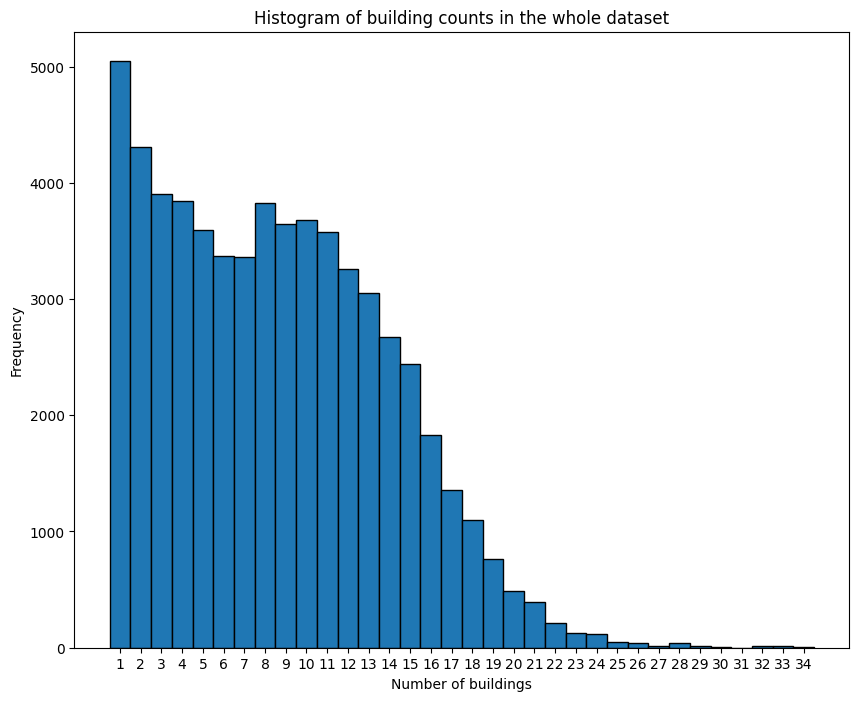

In [ ]:
# Buildings distribution in the whole dataset (60317 images)
count_buildings(full_df, "whole")

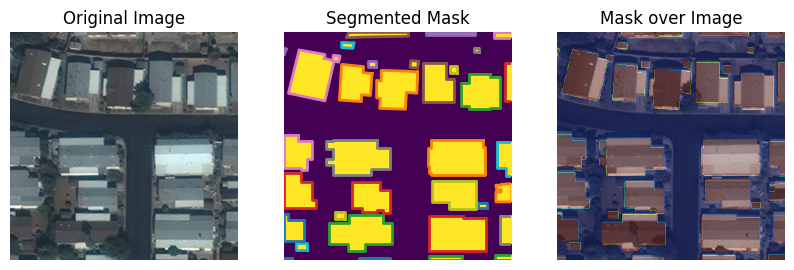

In [ ]:
# Visualize the image with most buildings (34)
most_building_img_id = full_df["image_id"].value_counts().keys()[0]   # we access the keys in the value_counts dict and take the first one since the values are ordered from the greatest to the smallest

visualize_img_from_id(full_df, most_building_img_id, img_dir)

## Data Split

In [ ]:
# Split the data in train (70%), validation (15%), test (15%)

rs = 42
nImages = 8000  # decide how many images out of 60317 to use

# First, split into 70% train and 30% (validation + test)
train_ids, temp_ids = train_test_split(image_df[:nImages]['id'], test_size=0.3, random_state=rs)

# Then, split the 30% into half (15% validation and 15% test)
valid_ids, test_ids = train_test_split(temp_ids, test_size=0.5, random_state=rs)

# Create the corresponding DataFrames
train_df = full_df[full_df['image_id'].isin(train_ids)]
valid_df = full_df[full_df['image_id'].isin(valid_ids)]
test_df = full_df[full_df['image_id'].isin(test_ids)]

# Print the number of items in each set
print(train_df.shape[0], 'training boxes')
print(valid_df.shape[0], 'validation boxes')
print(test_df.shape[0], 'test boxes')

47763 training boxes
10172 validation boxes
10472 test boxes


In [ ]:
# Print the number of images in each set
print(len(train_df["image_id"].unique()), 'training images')
print(len(valid_df["image_id"].unique()), 'validation images')
print(len(test_df["image_id"].unique()), 'testing images')


5600 training images
1200 validation images
1200 testing images


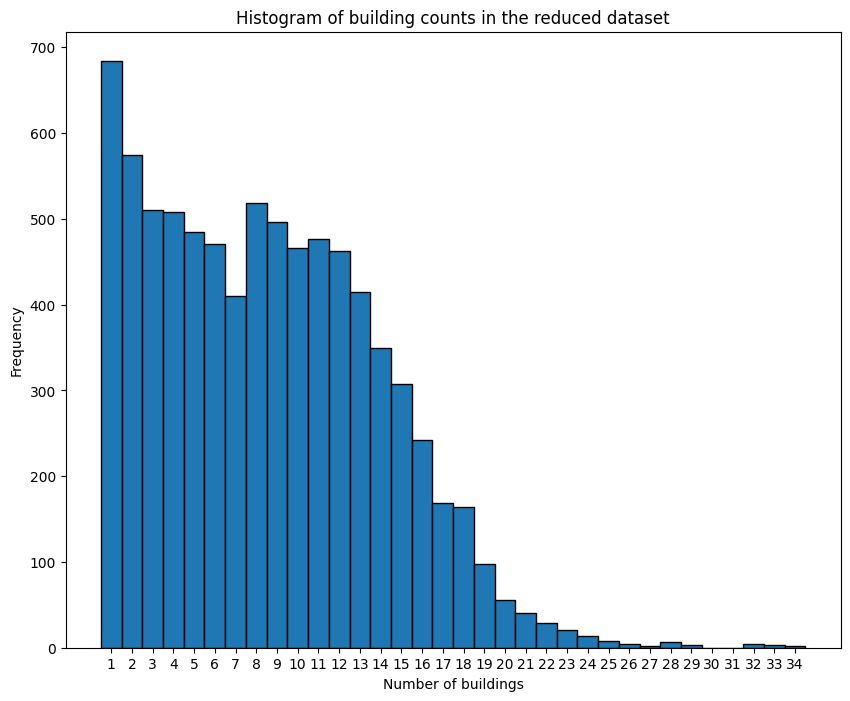

In [ ]:
# Buildings distribution in the reduced dataset
count_buildings(pd.concat((train_df, valid_df, test_df)), "reduced")

The distribution remains similar to the one of the whole dataset

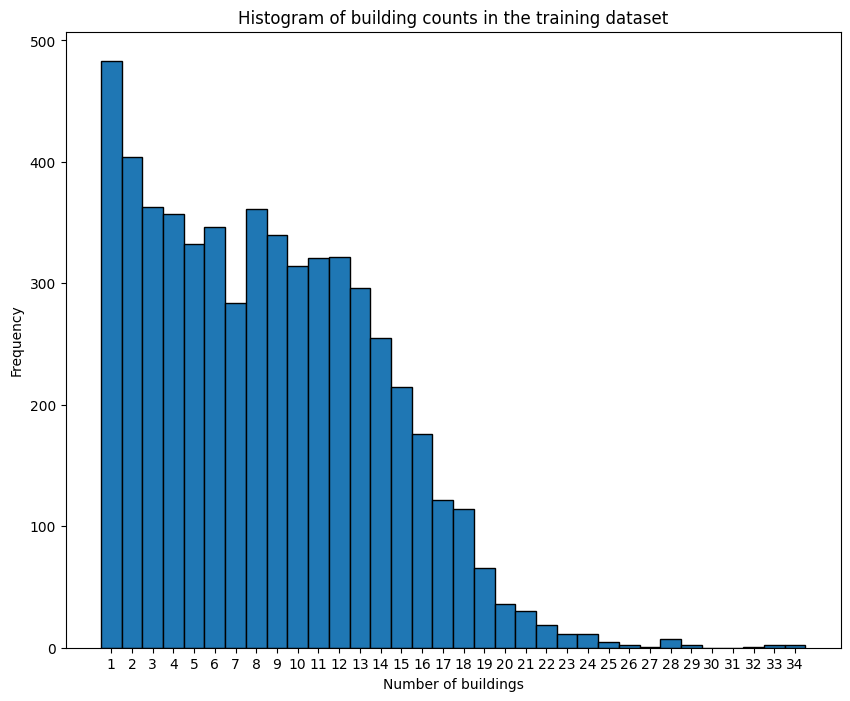

In [ ]:
# Buildings distribution in training set
count_buildings(train_df, "training")

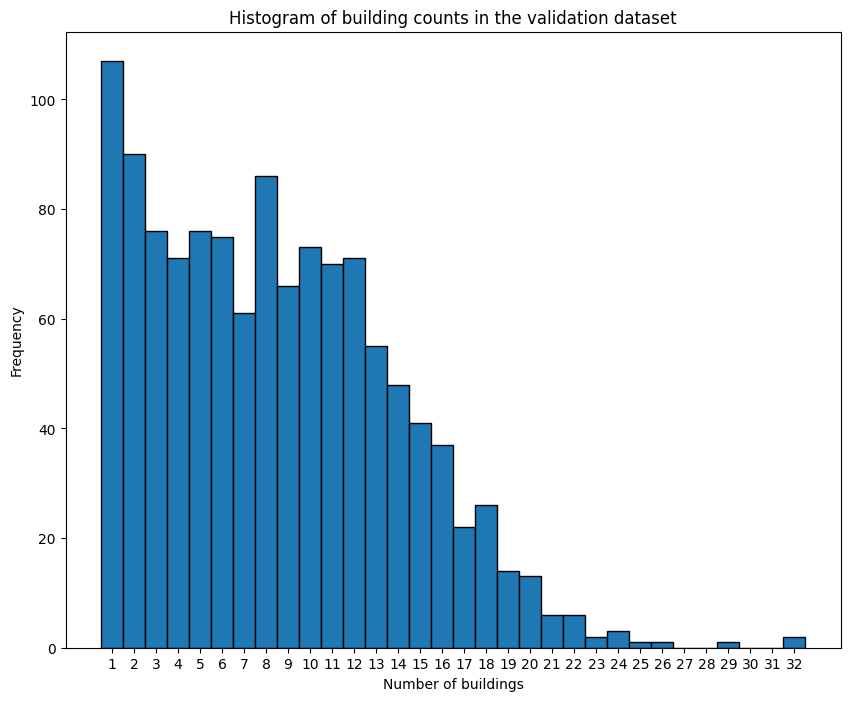

In [ ]:
# Buildings distribution in validation set
count_buildings(valid_df, "validation")

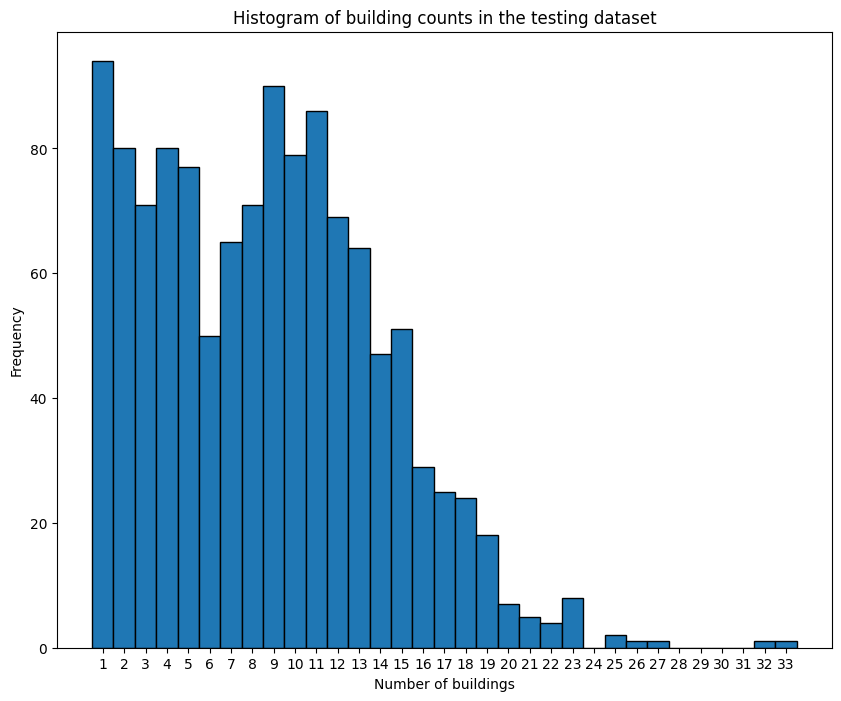

In [ ]:
# Buildings distribution in testing set
count_buildings(test_df, "testing")

## Dataloader

In [ ]:
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
device = torch.device("cuda:0" if train_on_gpu else "cpu")
print(device)

CUDA is available!  Training on GPU ...
cuda:0


In [ ]:
class MappingDataset(Dataset):
  def __init__(self, df, image_dir, transform=None):
    self.image_ids = df['image_id'].unique()  # unique image ids
    self.df = df
    self.image_dir = image_dir
    self.transform = transform

  def __len__(self):
    return len(self.image_ids)

  def __getitem__(self, idx):
    img_id = self.image_ids[idx]
    img_filename = self.df[self.df['image_id'] == img_id].iloc[0]['file_name']

    # Load image
    img_path = os.path.join(self.image_dir, img_filename)
    image = io.imread(img_path)

    # Get segmentation mask for the image
    seg_mask = self._get_segmentation_mask(img_id)

    # Apply transformations
    if self.transform:
      transf = self.transform(image=image, mask=seg_mask)
      image = transf['image'] / 255.0   # normalize
      seg_mask = transf['mask']

    image = image.float()
    seg_mask = seg_mask.float()

    # Add a channel dimension to the mask
    seg_mask = np.expand_dims(seg_mask, axis=0)

    return image, seg_mask

  def _get_segmentation_mask(self, img_id):
    # Filter annotations for the given image id
    annotations = self.df[self.df['image_id'] == img_id]

    # Initialize empty mask
    mask = np.zeros((300, 300))

    # Iterate over annotations and draw segmentation masks
    for _, annot in annotations.iterrows():
      xy_vec = np.array(annot['segmentation']).reshape((-1, 2))
      mask = cv2.fillPoly(mask, [xy_vec.astype(np.int32)], color=1)

      # mask = np.clip(mask, 0, 1).astype(np.float32)


    return mask.astype(np.float32)

In [ ]:
# Define training transformations (with augmentations)

transform_train = A.Compose([
    A.Resize(width=256, height=256),
    A.Rotate(limit=30, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    ToTensorV2()
])

# Define validation/testing transformations

transform_valid = A.Compose([
    A.Resize(width=256, height=256),
    ToTensorV2()
])

BATCH_SIZE = 16

# Initialize dataset and dataloaders
train_dataset = MappingDataset(train_df, img_dir, transform=transform_train)
valid_dataset = MappingDataset(valid_df, img_dir, transform=transform_valid)
test_dataset = MappingDataset(test_df, img_dir, transform=transform_valid)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)


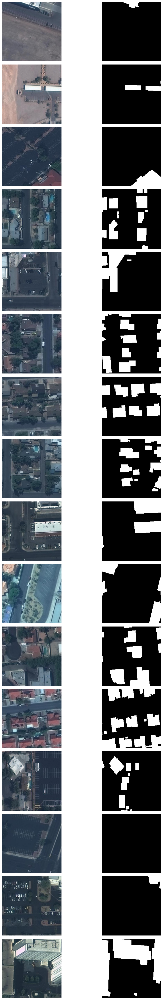

In [ ]:
# Visualize a training batch
visualize_batch(train_loader)

## Model definition

Run one of the two following sections. Run the second one with resnet101 encoder to use my pre-trained weights.

### Manually defined U-Net with ResNet backbone
U-Net: https://arxiv.org/pdf/1505.04597   
ResNet: https://arxiv.org/pdf/1512.03385

In [ ]:
'''
2D Convolution + ReLU
'''
class ConvRelu(nn.Module):
  def __init__(self, in_, out):
    super().__init__()
    self.conv = nn.Conv2d(in_, out, 3, padding=1)
    self.activation = nn.ReLU(inplace=True)

  def forward(self, x):
    x = self.conv(x)
    x = self.activation(x)
    return x

In [ ]:
'''
Decoder block with deconvolution
'''
class DecoderBlock(nn.Module):
  def __init__(self, in_channels, middle_channels, out_channels):
    super(DecoderBlock, self).__init__()
    self.in_channels = in_channels

    self.block = nn.Sequential(
      ConvRelu(in_channels, middle_channels),
      nn.ConvTranspose2d(middle_channels, out_channels, kernel_size=4, stride=2,
                          padding=1),
      nn.ReLU(inplace=True)
    )

  def forward(self, x):
    return self.block(x)

In [ ]:
'''
Build U-Net model using ResNet(34, 50 or 101) encoder
'''
class UNetResNet(nn.Module):

  def __init__(self, encoder_depth, num_classes, num_filters=16, dropout_2d=0.2,
                pretrained=False):
    super().__init__()
    self.num_classes = num_classes
    self.dropout_2d = dropout_2d

    if encoder_depth == 34:
      self.encoder = torchvision.models.resnet34(pretrained=pretrained)
      bottom_channel_nr = 512
    elif encoder_depth == 50:
      self.encoder = torchvision.models.resnet50(pretrained=pretrained)
      bottom_channel_nr = 2048
    elif encoder_depth == 101:
      self.encoder = torchvision.models.resnet101(pretrained=pretrained)
      bottom_channel_nr = 2048
    else:
      raise NotImplementedError('Only Resnet34, Resnet50, and Resnet101 are implemented')

    self.pool = nn.MaxPool2d(2, 2)

    self.relu = nn.ReLU(inplace=True)

    self.conv1 = nn.Sequential(self.encoder.conv1,
                                self.encoder.bn1,
                                self.encoder.relu,
                                self.pool)

    self.conv2 = self.encoder.layer1

    self.conv3 = self.encoder.layer2

    self.conv4 = self.encoder.layer3

    self.conv5 = self.encoder.layer4

    self.center = DecoderBlock(bottom_channel_nr, num_filters * 8 * 2, num_filters * 8)
    self.dec5 = DecoderBlock(bottom_channel_nr + num_filters * 8, num_filters * 8 * 2, num_filters * 8)
    self.dec4 = DecoderBlock(bottom_channel_nr // 2 + num_filters * 8, num_filters * 8 * 2, num_filters * 8)
    self.dec3 = DecoderBlock(bottom_channel_nr // 4 + num_filters * 8, num_filters * 4 * 2, num_filters * 2)
    self.dec2 = DecoderBlock(bottom_channel_nr // 8 + num_filters * 2, num_filters * 2 * 2, num_filters * 2 * 2)
    self.dec1 = DecoderBlock(num_filters * 2 * 2, num_filters * 2 * 2, num_filters)
    self.dec0 = ConvRelu(num_filters, num_filters)
    self.final = nn.Conv2d(num_filters, num_classes, kernel_size=1)

  def forward(self, x):
    conv1 = self.conv1(x)
    conv2 = self.conv2(conv1)
    conv3 = self.conv3(conv2)
    conv4 = self.conv4(conv3)
    conv5 = self.conv5(conv4)

    pool = self.pool(conv5)
    center = self.center(pool)

    dec5 = self.dec5(torch.cat([center, conv5], 1))

    dec4 = self.dec4(torch.cat([dec5, conv4], 1))
    dec3 = self.dec3(torch.cat([dec4, conv3], 1))
    dec2 = self.dec2(torch.cat([dec3, conv2], 1))
    dec1 = self.dec1(dec2)
    dec0 = self.dec0(dec1)

    return self.final(F.dropout2d(dec0, p=self.dropout_2d))

In [ ]:
model = UNetResNet(encoder_depth=50, num_classes=1, pretrained=True)
model.to(device)


# Train the decoder only
for param in model.encoder.parameters():
    param.requires_grad = False


# Summary of the network
summary(model,(3,256,256))

In [ ]:
# Number of trainable parameters
sum(p.numel() for p in model.parameters() if p.requires_grad)

### U-Net with segmentation-models-pytorch

In [ ]:
# Define UNet model
model = smp.Unet(
    encoder_name="resnet101",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
)

model.to(device)

"""
# Train the decoder only
for param in model.encoder.parameters():
    param.requires_grad = False
"""

# Summary of the network
summary(model,(3,256,256))

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:02<00:00, 85.2MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# Number of trainable parameters
sum(p.numel() for p in model.parameters() if p.requires_grad)

51513233

### MultiResUNet
Paper: https://arxiv.org/pdf/1902.04049

In [ ]:
'''
2D convolutional layers with batch normalization
'''
class Conv2d_bn(torch.nn.Module):

	def __init__(self, in_filters, out_filters, kernel_size, stride=(1,1), activation='relu'):
		super().__init__()
		self.activation = activation
		self.conv1 = nn.Conv2d(in_channels=in_filters, out_channels=out_filters, kernel_size=kernel_size, stride=stride, padding='same')
		self.batchnorm = nn.BatchNorm2d(out_filters)

	def forward(self,x):
		x = self.conv1(x)
		x = self.batchnorm(x)

		if self.activation == 'relu':
			return nn.functional.relu(x)
		else:
			return x


class Multiresblock(torch.nn.Module):

	def __init__(self, num_in_channels, num_filters, alpha=1.67):

		super().__init__()
		self.alpha = alpha      # value suggested by the paper
		self.W = num_filters * alpha

		filt_3x3 = int(self.W*0.167)    # values suggested by the paper
		filt_5x5 = int(self.W*0.333)
		filt_7x7 = int(self.W*0.5)
		num_out_filters = filt_3x3 + filt_5x5 + filt_7x7

		self.shortcut = Conv2d_bn(num_in_channels, num_out_filters, kernel_size=(1,1), activation='None')

		self.conv_3x3 = Conv2d_bn(num_in_channels, filt_3x3, kernel_size=(3,3), activation='relu')

		self.conv_5x5 = Conv2d_bn(filt_3x3, filt_5x5, kernel_size=(3,3), activation='relu')

		self.conv_7x7 = Conv2d_bn(filt_5x5, filt_7x7, kernel_size=(3,3), activation='relu')

		self.batch_norm1 = nn.BatchNorm2d(num_out_filters)
		self.batch_norm2 = nn.BatchNorm2d(num_out_filters)

	def forward(self,x):

		shortcut = self.shortcut(x)

		a = self.conv_3x3(x)
		b = self.conv_5x5(a)
		c = self.conv_7x7(b)

		x = torch.cat([a,b,c], axis=1)
		x = self.batch_norm1(x)

		x = x + shortcut
		x = self.batch_norm2(x)
		x = nn.functional.relu(x)

		return x


''' Instead of simply concatenating the feature maps from the encoder stage to the decoder stage,
we first pass them through a chain of convolutional layers with residual connections, and then concatenate with the
decoder features. We call this proposed shortcut path ‘Res path’'''
# Generalization of Skip Connections
class Respath(torch.nn.Module):

	def __init__(self, in_filters, out_filters, respath_length):

		super().__init__()

		self.respath_length = respath_length
		self.shortcuts = nn.ModuleList([])
		self.convs = nn.ModuleList([])
		self.bns = nn.ModuleList([])

		for i in range(self.respath_length):
			if(i==0):
				self.shortcuts.append(Conv2d_bn(in_filters, out_filters, kernel_size=(1,1), activation='None'))
				self.convs.append(Conv2d_bn(in_filters, out_filters, kernel_size=(3,3),activation='relu'))


			else:
				self.shortcuts.append(Conv2d_bn(out_filters, out_filters, kernel_size=(1,1), activation='None'))
				self.convs.append(Conv2d_bn(out_filters, out_filters, kernel_size=(3,3), activation='relu'))

			self.bns.append(nn.BatchNorm2d(out_filters))


	def forward(self,x):

		for i in range(self.respath_length):

			shortcut = self.shortcuts[i](x)

			x = self.convs[i](x)
			x = self.bns[i](x)
			x = nn.functional.relu(x)

			x = x + shortcut
			x = self.bns[i](x)
			x = nn.functional.relu(x)

		return x


'''
Build the MultiResUNet
'''
class MultiResUNet(torch.nn.Module):

	def __init__(self, input_channels, num_classes, alpha=1.67):
		super().__init__()

		self.alpha = alpha

		# Encoder Path
		self.mresblock1 = Multiresblock(input_channels, 32)
		self.in_filters1 = int(32*self.alpha*0.167) + int(32*self.alpha*0.333) + int(32*self.alpha* 0.5)
		self.pool1 = nn.MaxPool2d(2)
		self.respath1 = Respath(self.in_filters1, 32, respath_length=4)

		self.mresblock2 = Multiresblock(self.in_filters1, 32*2)
		self.in_filters2 = int(32*2*self.alpha*0.167) + int(32*2*self.alpha*0.333) + int(32*2*self.alpha* 0.5)
		self.pool2 = nn.MaxPool2d(2)
		self.respath2 = Respath(self.in_filters2, 32*2, respath_length=3)


		self.mresblock3 =  Multiresblock(self.in_filters2, 32*4)
		self.in_filters3 = int(32*4*self.alpha*0.167) + int(32*4*self.alpha*0.333) + int(32*4*self.alpha* 0.5)
		self.pool3 = nn.MaxPool2d(2)
		self.respath3 = Respath(self.in_filters3, 32*4, respath_length=2)


		self.mresblock4 = Multiresblock(self.in_filters3, 32*8)
		self.in_filters4 = int(32*8*self.alpha*0.167) + int(32*8*self.alpha*0.333) + int(32*8*self.alpha* 0.5)
		self.pool4 = nn.MaxPool2d(2)
		self.respath4 = Respath(self.in_filters4, 32*8, respath_length=1)


		self.mresblock5 = Multiresblock(self.in_filters4, 32*16)
		self.in_filters5 = int(32*16*self.alpha*0.167) + int(32*16*self.alpha*0.333) + int(32*16*self.alpha* 0.5)

		# Decoder path
		self.upsample6 = nn.ConvTranspose2d(self.in_filters5, 32*8, kernel_size=(2,2), stride=(2,2))
		self.concat_filters1 = 32*8 *2
		self.mresblock6 = Multiresblock(self.concat_filters1, 32*8)
		self.in_filters6 = int(32*8*self.alpha*0.167) + int(32*8*self.alpha*0.333) + int(32*8*self.alpha* 0.5)

		self.upsample7 = nn.ConvTranspose2d(self.in_filters6, 32*4, kernel_size=(2,2), stride=(2,2))
		self.concat_filters2 = 32*4 *2
		self.mresblock7 = Multiresblock(self.concat_filters2, 32*4)
		self.in_filters7 = int(32*4*self.alpha*0.167) + int(32*4*self.alpha*0.333) + int(32*4*self.alpha* 0.5)

		self.upsample8 = nn.ConvTranspose2d(self.in_filters7, 32*2, kernel_size=(2,2), stride=(2,2))
		self.concat_filters3 = 32*2*2
		self.mresblock8 = Multiresblock(self.concat_filters3, 32*2)
		self.in_filters8 = int(32*2*self.alpha*0.167) + int(32*2*self.alpha*0.333) + int(32*2*self.alpha* 0.5)

		self.upsample9 = nn.ConvTranspose2d(self.in_filters8, 32, kernel_size=(2,2), stride=(2,2))
		self.concat_filters4 = 32 *2
		self.mresblock9 = Multiresblock(self.concat_filters4, 32)
		self.in_filters9 = int(32*self.alpha*0.167) + int(32*self.alpha*0.333) + int(32*self.alpha* 0.5)

		self.conv_final = Conv2d_bn(self.in_filters9, num_classes, kernel_size=(1,1), activation='None')

	def forward(self,x:torch.Tensor)->torch.Tensor:

		x_multires1 = self.mresblock1(x)
		x_pool1 = self.pool1(x_multires1)
		x_multires1 = self.respath1(x_multires1)

		x_multires2 = self.mresblock2(x_pool1)
		x_pool2 = self.pool2(x_multires2)
		x_multires2 = self.respath2(x_multires2)

		x_multires3 = self.mresblock3(x_pool2)
		x_pool3 = self.pool3(x_multires3)
		x_multires3 = self.respath3(x_multires3)

		x_multires4 = self.mresblock4(x_pool3)
		x_pool4 = self.pool4(x_multires4)
		x_multires4 = self.respath4(x_multires4)

		x_multires5 = self.mresblock5(x_pool4)

		up6 = torch.cat([self.upsample6(x_multires5), x_multires4], axis=1)
		x_multires6 = self.mresblock6(up6)

		up7 = torch.cat([self.upsample7(x_multires6), x_multires3], axis=1)
		x_multires7 = self.mresblock7(up7)

		up8 = torch.cat([self.upsample8(x_multires7), x_multires2], axis=1)
		x_multires8 = self.mresblock8(up8)

		up9 = torch.cat([self.upsample9(x_multires8), x_multires1], axis=1)
		x_multires9 = self.mresblock9(up9)

		out = self.conv_final(x_multires9)

		return out

In [ ]:
model = MultiResUNet(input_channels=3, num_classes=1)
model.to(device)


# Summary of the network
summary(model,(3,256,256))

In [ ]:
# Number of trainable parameters
sum(p.numel() for p in model.parameters() if p.requires_grad)

## Training

Skip if you want to use the pre-trained model

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR, StepLR, ReduceLROnPlateau  # learning rate scheduler for training

# Define number of training epochs
EPOCHS = 50

# Define loss function
loss_fn = smp.losses.DiceLoss(mode='binary')

# Define optimizer and scheduler
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5)
# scheduler = CosineAnnealingLR(optimizer,
#                               T_max=len(train_loader) * EPOCHS,  # maximum number of iterations for scheduler
#                               eta_min=1e-5)  # minimum learning rate for scheduler
# scheduler = StepLR(optimizer, step_size=6, gamma=0.1)
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=3)


In [ ]:
# Training and validation routine

def train_validate(model, device, train_loader, valid_loader, loss_fn, optimizer, scheduler=None, epochs=10, patience=5):
  # Initialize variables for early stopping
  best_model = None
  best_loss = np.inf    # + inf
  curr_patience = patience

  # Initialize variables to save losses and accuracies
  epoch_train_loss = []
  epoch_val_loss = []
  epoch_train_accuracies = []
  epoch_val_accuracies = []

  actual_epochs = 0
  THRESHOLD = 0.5   # threshold to create binary masks
  start = time.time()

  # Training loop
  for epoch in tqdm(range(epochs)):
    actual_epochs += 1
    # Training
    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0
    for images, masks in tqdm(train_loader):
      images, masks = images.to(device), masks.to(device)

      optimizer.zero_grad()

      # Forward pass
      outputs = model(images)

      # Compute loss
      loss = loss_fn(outputs, masks)

      # Backward pass and optimization
      loss.backward()
      optimizer.step()
      # scheduler.step()  # UNCOMMENT IF USING StepLR or CosineAnnealingLR

      train_loss += loss.item() # * images.size(0)

      # Calculate pixel accuracy
      predicted_masks = (outputs > THRESHOLD).float()
      train_correct += (predicted_masks == masks).sum().item()
      train_total += masks.numel()

    # Compute average training loss and accuracy
    train_loss /= len(train_loader)
    train_accuracy = train_correct / train_total
    epoch_train_loss.append(train_loss)
    epoch_train_accuracies.append(train_accuracy*100)

    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
      for images, masks in tqdm(valid_loader):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        val_loss += loss_fn(outputs, masks).item() # * images.size(0)

        # Calculate pixel accuracy
        predicted_masks = (outputs > THRESHOLD).float()
        val_correct += (predicted_masks == masks).sum().item()
        val_total += masks.numel()

    # Compute average validation loss and accuracy
    val_loss /= len(valid_loader)
    val_accuracy = val_correct / val_total
    epoch_val_loss.append(val_loss)
    epoch_val_accuracies.append(val_accuracy*100)

    if scheduler:
      scheduler.step(val_loss)    # COMMENT IF USING StepLR or CosineAnnealingLR


    # Track best model and save weights if validation loss improves
    if val_loss < best_loss:
      best_loss = val_loss
      best_model = model.state_dict()
      torch.save(best_model, "best-unet.pth")
      curr_patience = 5
      print("**BEST**", end="")
    else:
      curr_patience -= 1

    # Print training/validation statistics
    print(f"Epoch {epoch + 1}/{epochs}: Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Valid Loss: {val_loss:.4f}, Valid Accuracy: {val_accuracy:.4f}")

    # Implement early stopping
    if curr_patience <= 0:
      print("Stop training!")
      break

  end = time.time()
  print(f"Total training time: {round(end-start,2)} seconds")

  return epoch_train_loss, epoch_val_loss, epoch_train_accuracies, epoch_val_accuracies, actual_epochs


In [ ]:
epoch_train_loss, epoch_val_loss, epoch_train_accuracies, epoch_val_accuracies, actual_epochs = train_validate(model, device, train_loader,
                                                                                                               valid_loader, loss_fn, optimizer,
                                                                                                               scheduler=scheduler, epochs=EPOCHS,
                                                                                                               patience=5)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 1/50: Train Loss: 0.3040, Train Accuracy: 0.8970, Valid Loss: 0.2007, Valid Accuracy: 0.9243


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 2/50: Train Loss: 0.1723, Train Accuracy: 0.9327, Valid Loss: 0.1461, Valid Accuracy: 0.9394


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 3/50: Train Loss: 0.1438, Train Accuracy: 0.9397, Valid Loss: 0.1486, Valid Accuracy: 0.9363


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 4/50: Train Loss: 0.1354, Train Accuracy: 0.9415, Valid Loss: 0.1236, Valid Accuracy: 0.9470


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 5/50: Train Loss: 0.1309, Train Accuracy: 0.9426, Valid Loss: 0.1511, Valid Accuracy: 0.9310


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 6/50: Train Loss: 0.1218, Train Accuracy: 0.9463, Valid Loss: 0.1170, Valid Accuracy: 0.9478


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 7/50: Train Loss: 0.1234, Train Accuracy: 0.9452, Valid Loss: 0.1138, Valid Accuracy: 0.9494


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 8/50: Train Loss: 0.1176, Train Accuracy: 0.9475, Valid Loss: 0.1128, Valid Accuracy: 0.9504


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 9/50: Train Loss: 0.1175, Train Accuracy: 0.9475, Valid Loss: 0.1125, Valid Accuracy: 0.9491


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 10/50: Train Loss: 0.1144, Train Accuracy: 0.9488, Valid Loss: 0.1074, Valid Accuracy: 0.9518


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 11/50: Train Loss: 0.1119, Train Accuracy: 0.9499, Valid Loss: 0.1142, Valid Accuracy: 0.9492


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 12/50: Train Loss: 0.1106, Train Accuracy: 0.9504, Valid Loss: 0.1114, Valid Accuracy: 0.9487


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 13/50: Train Loss: 0.1055, Train Accuracy: 0.9527, Valid Loss: 0.1076, Valid Accuracy: 0.9514


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 14/50: Train Loss: 0.1081, Train Accuracy: 0.9514, Valid Loss: 0.1070, Valid Accuracy: 0.9523


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 15/50: Train Loss: 0.1055, Train Accuracy: 0.9526, Valid Loss: 0.1026, Valid Accuracy: 0.9535


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 16/50: Train Loss: 0.1045, Train Accuracy: 0.9530, Valid Loss: 0.1030, Valid Accuracy: 0.9536


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 17/50: Train Loss: 0.1030, Train Accuracy: 0.9536, Valid Loss: 0.1018, Valid Accuracy: 0.9539


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 18/50: Train Loss: 0.1054, Train Accuracy: 0.9526, Valid Loss: 0.1029, Valid Accuracy: 0.9534


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 19/50: Train Loss: 0.1021, Train Accuracy: 0.9540, Valid Loss: 0.1047, Valid Accuracy: 0.9526


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 20/50: Train Loss: 0.1011, Train Accuracy: 0.9545, Valid Loss: 0.1011, Valid Accuracy: 0.9543


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 21/50: Train Loss: 0.1030, Train Accuracy: 0.9536, Valid Loss: 0.1010, Valid Accuracy: 0.9548


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 22/50: Train Loss: 0.0991, Train Accuracy: 0.9553, Valid Loss: 0.0991, Valid Accuracy: 0.9551


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 23/50: Train Loss: 0.1040, Train Accuracy: 0.9531, Valid Loss: 0.1015, Valid Accuracy: 0.9539


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 24/50: Train Loss: 0.0998, Train Accuracy: 0.9550, Valid Loss: 0.1011, Valid Accuracy: 0.9541


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 25/50: Train Loss: 0.1006, Train Accuracy: 0.9545, Valid Loss: 0.1015, Valid Accuracy: 0.9542


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 26/50: Train Loss: 0.0980, Train Accuracy: 0.9557, Valid Loss: 0.0962, Valid Accuracy: 0.9567


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 27/50: Train Loss: 0.0974, Train Accuracy: 0.9561, Valid Loss: 0.1045, Valid Accuracy: 0.9527


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 28/50: Train Loss: 0.1003, Train Accuracy: 0.9547, Valid Loss: 0.1056, Valid Accuracy: 0.9526


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 29/50: Train Loss: 0.0957, Train Accuracy: 0.9567, Valid Loss: 0.1007, Valid Accuracy: 0.9539


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 30/50: Train Loss: 0.0974, Train Accuracy: 0.9561, Valid Loss: 0.0972, Valid Accuracy: 0.9559


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 31/50: Train Loss: 0.0930, Train Accuracy: 0.9581, Valid Loss: 0.0942, Valid Accuracy: 0.9571


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 32/50: Train Loss: 0.0904, Train Accuracy: 0.9592, Valid Loss: 0.0925, Valid Accuracy: 0.9578


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 33/50: Train Loss: 0.0895, Train Accuracy: 0.9595, Valid Loss: 0.0917, Valid Accuracy: 0.9582


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 34/50: Train Loss: 0.0886, Train Accuracy: 0.9600, Valid Loss: 0.0918, Valid Accuracy: 0.9582


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 35/50: Train Loss: 0.0880, Train Accuracy: 0.9602, Valid Loss: 0.0910, Valid Accuracy: 0.9586


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 36/50: Train Loss: 0.0878, Train Accuracy: 0.9604, Valid Loss: 0.0910, Valid Accuracy: 0.9586


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 37/50: Train Loss: 0.0873, Train Accuracy: 0.9606, Valid Loss: 0.0905, Valid Accuracy: 0.9588


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 38/50: Train Loss: 0.0873, Train Accuracy: 0.9606, Valid Loss: 0.0902, Valid Accuracy: 0.9590


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 39/50: Train Loss: 0.0869, Train Accuracy: 0.9607, Valid Loss: 0.0907, Valid Accuracy: 0.9587


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 40/50: Train Loss: 0.0861, Train Accuracy: 0.9611, Valid Loss: 0.0891, Valid Accuracy: 0.9595


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 41/50: Train Loss: 0.0862, Train Accuracy: 0.9611, Valid Loss: 0.0905, Valid Accuracy: 0.9588


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 42/50: Train Loss: 0.0857, Train Accuracy: 0.9613, Valid Loss: 0.0897, Valid Accuracy: 0.9592


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

**BEST**Epoch 43/50: Train Loss: 0.0856, Train Accuracy: 0.9614, Valid Loss: 0.0890, Valid Accuracy: 0.9595


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 44/50: Train Loss: 0.0851, Train Accuracy: 0.9616, Valid Loss: 0.0894, Valid Accuracy: 0.9591


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 45/50: Train Loss: 0.0852, Train Accuracy: 0.9616, Valid Loss: 0.0893, Valid Accuracy: 0.9594


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 46/50: Train Loss: 0.0846, Train Accuracy: 0.9618, Valid Loss: 0.0900, Valid Accuracy: 0.9590


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 47/50: Train Loss: 0.0843, Train Accuracy: 0.9619, Valid Loss: 0.0891, Valid Accuracy: 0.9595


  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 48/50: Train Loss: 0.0845, Train Accuracy: 0.9619, Valid Loss: 0.0895, Valid Accuracy: 0.9592
Stop training!
Total training time: 6041.48 seconds


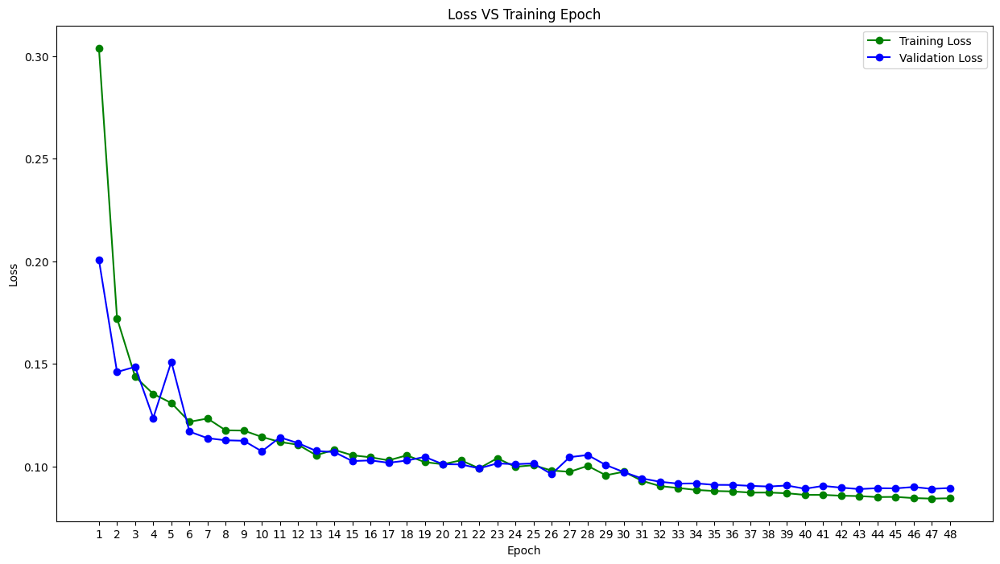

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15,8))
plt.plot(np.arange(actual_epochs)+1, epoch_train_loss, '-og', label="Training Loss")
plt.plot(np.arange(actual_epochs)+1, epoch_val_loss, '-ob', label="Validation Loss")
plt.title("Loss VS Training Epoch")
plt.xticks(np.arange(actual_epochs)+1)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

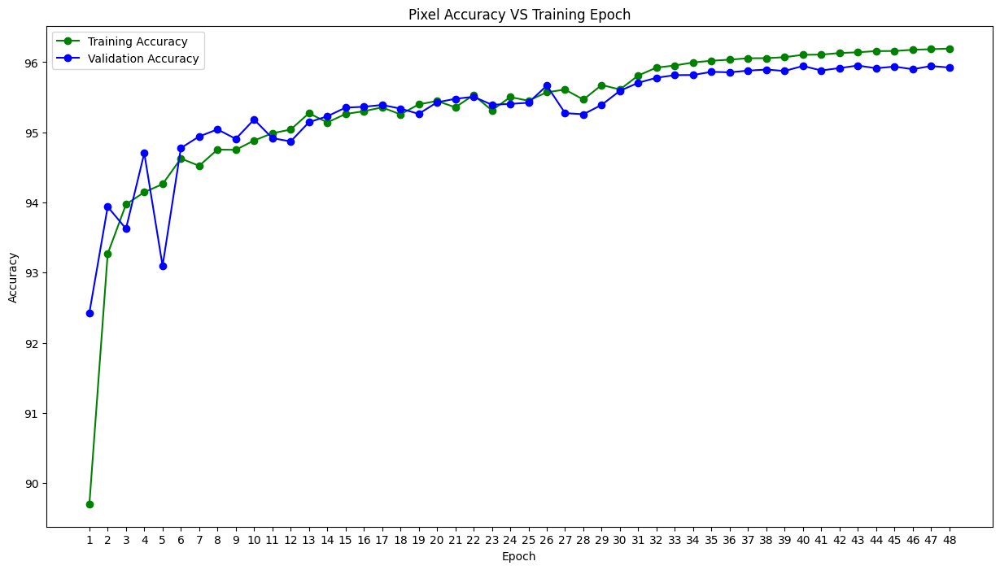

In [ ]:
# Plot training and validation accuracy
plt.figure(figsize=(15,8))
plt.plot(np.arange(actual_epochs)+1, epoch_train_accuracies, '-og', label="Training Accuracy")
plt.plot(np.arange(actual_epochs)+1, epoch_val_accuracies, '-ob', label="Validation Accuracy")
plt.title("Pixel Accuracy VS Training Epoch")
plt.xticks(np.arange(actual_epochs)+1)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## Evaluation

### Evaluation metrics

In [ ]:
def iou_score(pred, target):
  intersection = np.logical_and(pred, target).sum()
  union = np.logical_or(pred, target).sum()
  if union == 0:
    return 1.0  # both pred and target are empty
  else:
    return intersection / union


def dice_coeff(pred, target):
  intersection = np.logical_and(pred, target).sum()
  return 2 * intersection / (pred.sum() + target.sum() + 1e-6)  # we add a small epsilon to avoid division by zero


def precision(pred, target):
  tp = np.logical_and(pred, target).sum()  # true positives
  fp = np.logical_and(pred, np.logical_not(target)).sum()  # false positives
  if tp + fp == 0:
    return 1.0 if tp == 0 else 0.0  # in case pred is empty we return 1 if there was nothing to predict, 0 otherwise
  else:
    return tp / (tp + fp)


def recall(pred, target):
  tp = np.logical_and(pred, target).sum()
  fn = np.logical_and(np.logical_not(pred), target).sum()
  if tp + fn == 0:
    return 1.0 if tp == 0 else 0.0    # in case pred is empty we return 1 if there was nothing to predict, 0 otherwise
  else:
    return tp / (tp + fn)


# Function to evaluate model and compute metrics
def evaluate_model(model, test_loader, device):

  model.eval()
  iou_scores = []
  dice_scores = []
  precision_scores = []
  recall_scores = []

  with torch.no_grad():
    for images, gt_masks in tqdm(test_loader):
      images, gt_masks = images.to(device), gt_masks.to(device)
      outputs = model(images)

      pred_masks = torch.sigmoid(outputs) > 0.5  # threshold to get binary mask

      for i in range(images.size(0)):
        pred_mask_np = pred_masks[i].cpu().numpy().astype(bool)
        gt_mask_np = gt_masks[i].cpu().numpy().astype(bool)

        iou = iou_score(pred_mask_np, gt_mask_np)
        dice = dice_coeff(pred_mask_np, gt_mask_np)
        prec = precision(pred_mask_np, gt_mask_np)
        rec = recall(pred_mask_np, gt_mask_np)

        iou_scores.append(iou)
        dice_scores.append(dice)
        precision_scores.append(prec)
        recall_scores.append(rec)

  mean_iou = np.mean(iou_scores)
  mean_dice = np.mean(dice_scores)
  mean_prec = np.mean(precision_scores)
  mean_recall = np.mean(recall_scores)

  return mean_iou, mean_dice, mean_prec, mean_recall

Make sure you write your path to load the pre-trained model

In [ ]:
# Load the best model
best_model = torch.load("/content/drive/MyDrive/ACT/resnet101_final.pth", map_location=torch.device('cpu'))   # LOAD THE PRE-TRAINED MODEL FOR EVALUATION
                                                                                                              # REMOVE THE map_location IF RUNNING ON CUDA
# best_model = torch.load("best-unet.pth")    # USE THIS IF TRAINING WAS PERFORMED IN THIS RUN
model.load_state_dict(best_model)
model.to(device)

# Compute and print metrics for the test set
mean_iou, mean_dice, mean_prec, mean_recall = evaluate_model(model, test_loader, device)
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean Dice Coefficient: {mean_dice:.4f}")
print(f"Mean Precision: {mean_prec:.4f}")
print(f"Mean Recall: {mean_recall:.4f}")

  0%|          | 0/75 [00:00<?, ?it/s]

Mean IoU: 0.8036
Mean Dice Coefficient: 0.8797
Mean Precision: 0.9000
Mean Recall: 0.8815


We observe that decreasing the threshold value (up to 0.1) can slightly improve the metrics (by about 0.5%), however if we visualize the masks produced with this new threshold they're significantly worse. Thus, we keep the threshold set to 0.5, after checking that it generally produces a good result.

### Test Time Augmentation (TTA)

In order to obtain a more robust prediction we use Test Time Augmentation.  
The key idea behind TTA is to apply various data augmentations to each test image and aggregate the predictions from these augmented versions to get a more accurate final prediction.  
In this case, to aggregate the predictions we chose a pixel-by-pixel **majority voting approach**: only if more than half output masks "voted" a specific pixel as foreground, that pixel will be set as foreground in the final mask (and the same for the background).  

STEPS:
- for each test image apply augmentations
- pass the augmented images to the network to obtain predicted masks
- apply reverse augmentations to the masks
- aggregate predictions



In [ ]:
"""
Applies TTA transformations to a batch of images and returns the average predictions and the threshold for majority voting
"""
def apply_tta(model, device, images, masks, tta_transforms, inverse_tta_transforms):
  MV_THRESH = math.ceil((len(tta_transforms) + 1) / 2) / (len(tta_transforms) + 1) - 1e-9    # threshold for majority voting

  batch_predictions = []

  # Add predictions for the original image (no transformation)
  original_images = images.to(device)
  
  # Get predictions for original images
  outputs = model(original_images)
  pred_masks = torch.sigmoid(outputs) > 0.5  # threshold
  
  batch_predictions.append(pred_masks)

  for tta, inverse_tta in zip(tta_transforms, inverse_tta_transforms):
    # Apply TTA transform
    augmented_images = torch.stack([tta(transforms.ToPILImage()(img.cpu())) for img in images])
    augmented_images = augmented_images.to(device)

    # Get predictions
    outputs = model(augmented_images)
    pred_masks = torch.sigmoid(outputs) > 0.5  # threshold

    # Apply reverse TTA transform to the output
    reversed_predictions = []
    for i in range(pred_masks.size(0)):
      pred_mask_img = transforms.ToPILImage()(pred_masks[i].cpu().float())
      reversed_pred_mask = inverse_tta(pred_mask_img)
      reversed_predictions.append(reversed_pred_mask)

    batch_predictions.append(torch.stack(reversed_predictions).to(device))

  #fig, axes = plt.subplots(len(batch_predictions), 5, figsize=(20, 5))
  #for i in range(len(batch_predictions)):
    #axes[1,i].imshow(batch_predictions[i][0].cpu().squeeze().numpy())

  # Average predictions
  avg_pred_masks = torch.mean(torch.stack(batch_predictions), dim=0)

  return avg_pred_masks, MV_THRESH


"""
Function to compute metrics on testing set using TTA predictions with majority voting
"""
# Evaluation function with TTA
def evaluate_model_tta(model, test_loader, device, tta_transforms, inverse_tta_transforms):

  model.eval()
  iou_scores = []
  dice_scores = []
  precision_scores = []
  recall_scores = []

  with torch.no_grad():
    for images, gt_masks in tqdm(test_loader):
      images, gt_masks = images.to(device), gt_masks.to(device)

      # Apply TTA and get average predicted masks and majority voting threshold
      avg_pred_masks, MV_THRESH = apply_tta(model, device, images, gt_masks, tta_transforms, inverse_tta_transforms)

      for i in range(images.size(0)):
        pred_mask_np = (avg_pred_masks[i].cpu().numpy() >= MV_THRESH).astype(bool)
        gt_mask_np = gt_masks[i].cpu().numpy().astype(bool)


        iou = iou_score(pred_mask_np, gt_mask_np)
        dice = dice_coeff(pred_mask_np, gt_mask_np)
        prec = precision(pred_mask_np, gt_mask_np)
        rec = recall(pred_mask_np, gt_mask_np)

        iou_scores.append(iou)
        dice_scores.append(dice)
        precision_scores.append(prec)
        recall_scores.append(rec)

  mean_iou = np.mean(iou_scores)
  mean_dice = np.mean(dice_scores)
  mean_prec = np.mean(precision_scores)
  mean_recall = np.mean(recall_scores)

  return mean_iou, mean_dice, mean_prec, mean_recall

In [ ]:
# Rotation of set angle to apply in TTA
class FixedRotation:
  def __init__(self, angle):
    self.angle = angle

  def __call__(self, img):
    return FUNC.rotate(img, self.angle)

# Define TTA transformations
tta_transforms = [
  transforms.Compose([transforms.RandomHorizontalFlip(p=1.0), transforms.ToTensor()]),
  transforms.Compose([transforms.RandomVerticalFlip(p=1.0), transforms.ToTensor()]),
  transforms.Compose([FixedRotation(90), transforms.ToTensor()]),
  transforms.Compose([FixedRotation(270), transforms.ToTensor()]),
]

# Define the inverse of the TTA transformations
inverse_tta_transforms = [
  transforms.Compose([transforms.RandomHorizontalFlip(p=1.0), transforms.ToTensor()]),
  transforms.Compose([transforms.RandomVerticalFlip(p=1.0), transforms.ToTensor()]),
  transforms.Compose([FixedRotation(-90), transforms.ToTensor()]),
  transforms.Compose([FixedRotation(-270), transforms.ToTensor()]),
 ]


In [ ]:
# Compute and print metrics for the test set with TTA
mean_iou_tta, mean_dice_tta, mean_prec_tta, mean_recall_tta = evaluate_model_tta(model, test_loader, device, tta_transforms, inverse_tta_transforms)

print(f"Mean IoU: {mean_iou_tta:.4f}")
print(f"Mean Dice Coefficient: {mean_dice_tta:.4f}")
print(f"Mean Precision: {mean_prec_tta:.4f}")
print(f"Mean Recall: {mean_recall_tta:.4f}")

  0%|          | 0/75 [00:00<?, ?it/s]

Mean IoU: 0.8064
Mean Dice Coefficient: 0.8811
Mean Precision: 0.9096
Mean Recall: 0.8772


### Visual evaluation

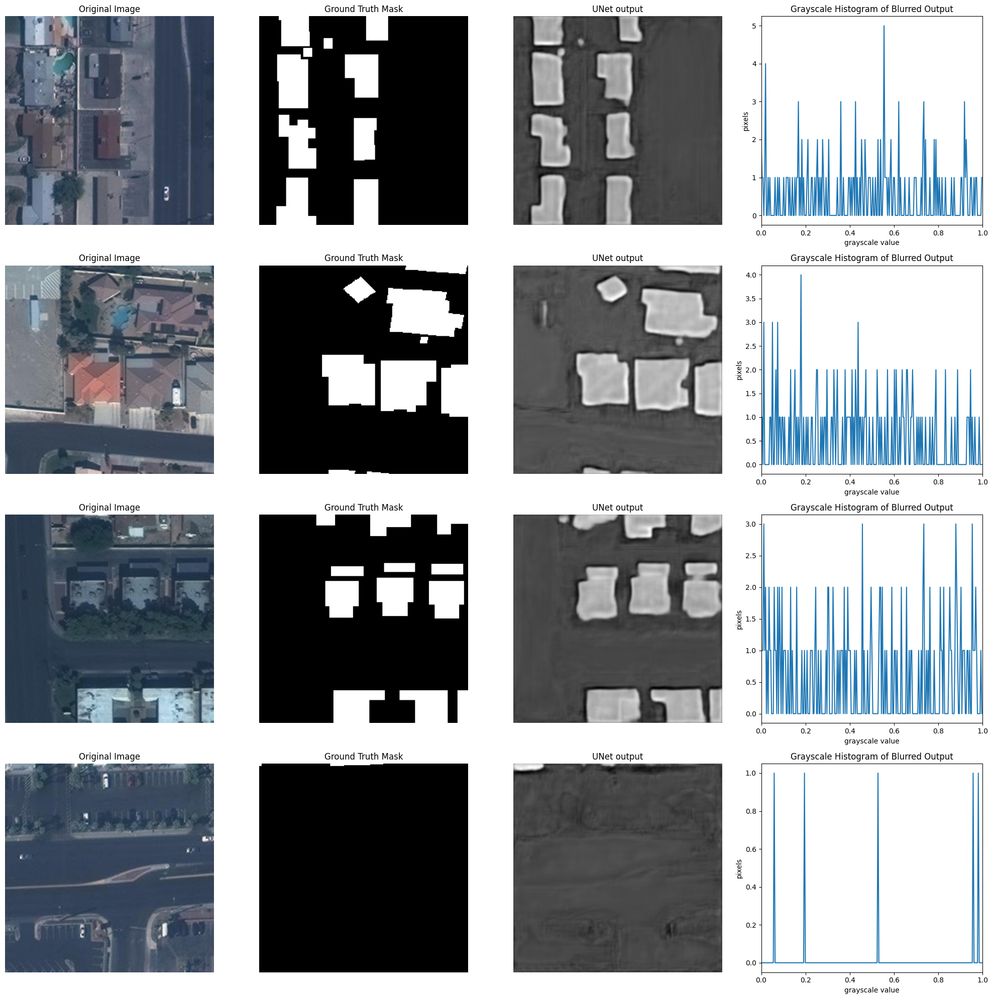

In [ ]:
"""
Function that plots the output of the unet as it is and the histogram of pixel values
"""

def plot_output_segm(model, test_loader, device, num_images=4):
  model.eval()
  images, gt_masks, pred_masks = [], [], []

  with torch.no_grad():
    for i, (image, gt_mask) in enumerate(test_loader):
      if i >= num_images:
        break
      image = image.to(device)
      gt_mask = gt_mask.to(device)
      output = model(image)

      images.append(image.cpu())
      gt_masks.append(gt_mask.cpu())
      pred_masks.append(output.cpu())


  fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
  for i in range(num_images):
    axes[i, 0].imshow(transforms.ToPILImage()(images[i][0]))  # convert 3D tensor (C, H, W) to 2D (H, W, C) and then to PIL image
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(gt_masks[i][0].squeeze().numpy(), cmap='gray')  # squeeze to ensure it's 2D and convert to numpy array for display
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(pred_masks[i][0].squeeze().numpy(), cmap='gray')      # ski.filters.gaussian(pred_masks[i][0].squeeze().numpy(), sigma=1.0)
    axes[i, 2].set_title('UNet output')
    axes[i, 2].axis('off')

    # create a histogram of the blurred grayscale image
    blurred_img = ski.filters.gaussian(pred_masks[i][0].squeeze().numpy(), sigma=1.0)
    histogram, bin_edges = np.histogram(blurred_img, bins=256, range=(0.0, 1.0))
    axes[i,3].plot(bin_edges[0:-1], histogram)
    axes[i,3].set_title("Grayscale Histogram of Blurred Output")
    axes[i,3].set_xlabel("grayscale value")
    axes[i,3].set_ylabel("pixels")
    axes[i,3].set_xlim(0, 1.0)

  plt.tight_layout()
  plt.show()

plot_output_segm(model, test_loader, device, num_images=4)

As we can see from the plot, the histogram is quite confusing, and it is hard to pick a value for the threshold as there are not clearly separate peaks. We will determine a good value for the threshold by visually inspecting the outputs.

In order to make our predicted mask visually more similar to the ground truth we can apply some **post-processing** operations. In particular, we apply closing and opening, and approximate the contours with polygon-like edges (since all the buildings have straight edges).

Post-processing info OpenCV:  

- Morphological operators: https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html  
- Contours: https://docs.opencv.org/4.x/d4/d73/tutorial_py_contours_begin.html




In [ ]:
"""
Function to post-process predicted mask by applying morph op + contours --> we can work on the epsilon param
"""
def post_process_mask(pred_mask):
  pred_mask = pred_mask.squeeze().numpy().astype(np.uint8) * 255  # convert to binary image with 0 and 255

  # Apply morphological operations
  kernel = np.ones((3, 3), np.uint8)
  pred_mask = cv2.morphologyEx(pred_mask, cv2.MORPH_CLOSE, kernel)  # CLOSING = DILATION + EROSION --> to close small holes in foreground objects
  pred_mask = cv2.morphologyEx(pred_mask, cv2.MORPH_OPEN, kernel)   # OPENING = EROSION + DILATION --> to remove noise

  # Find contours
  contours, _ = cv2.findContours(pred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Create an empty mask to draw polygons
  post_processed_mask = np.zeros_like(pred_mask)

  # Approximate contours with polygons and draw them on the mask
  for contour in contours:
    epsilon = 0.01 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)
    cv2.drawContours(post_processed_mask, [approx], -1, 255, thickness=cv2.FILLED)

  return torch.tensor(post_processed_mask // 255, dtype=torch.uint8)  # convert back to binary tensor


"""
Function to plot the same predictions to compare results (optionally post-processed)
"""
def plot_same_predictions(model, test_loader, device, post_proc=True, num_images=4):
  model.eval()
  images, gt_masks, pred_masks = [], [], []

  with torch.no_grad():
    for i, (image, gt_mask) in enumerate(test_loader):
      if i >= num_images:
        break
      image = image.to(device)
      gt_mask = gt_mask.to(device)
      output = model(image)

      pred_mask = torch.sigmoid(output) > 0.5  # we apply a threshold to get the binary mask. The smaller, the more white there will be (risks to merge close buildings)

      images.append(image.cpu())
      gt_masks.append(gt_mask.cpu())
      pred_masks.append(pred_mask.cpu())


  if post_proc:
    post_processed_masks = [post_process_mask(mask[0]) for mask in pred_masks]

  fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
  for i in range(num_images):
    axes[i, 0].imshow(transforms.ToPILImage()(images[i][0]))  # convert 3D tensor (C, H, W) to (H, W, C) and then to PIL image
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(gt_masks[i][0].squeeze().numpy(), cmap='gray')  # squeeze to ensure it's 2D and convert to numpy array for display
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')

    if post_proc:
      mask_to_show = post_processed_masks[i].numpy()
    else:
      mask_to_show = pred_masks[i][0].squeeze().numpy()

    axes[i, 2].imshow(mask_to_show, cmap='gray')
    axes[i, 2].set_title('Predicted Mask')
    axes[i, 2].axis('off')

    # Original Image with Post-Processed Mask Overlay
    axes[i, 3].imshow(transforms.ToPILImage()(images[i][0]))
    axes[i, 3].imshow(mask_to_show, cmap='jet', alpha=0.3)
    # axes[i,3].imshow(label2rgb(image=np.transpose(images[i][0].squeeze().numpy(), (1, 2, 0)), label=mask_to_show, bg_label = 0))
    axes[i, 3].set_title('Image with Predicted Mask Overlay')
    axes[i, 3].axis('off')

  plt.tight_layout()
  plt.show()


"""
Function to plot random predictions for outcome visualization (optionally post-processed)
"""
def plot_random_predictions(model, test_loader, device, post_proc=True, num_images=4):
  model.eval()
  images, gt_masks = [], []

  # Get all the images and masks from the test loader
  all_images, all_gt_masks = [], []
  for image, gt_mask in test_loader:
    all_images.append(image)
    all_gt_masks.append(gt_mask)

  # Concatenate all batches
  all_images = torch.cat(all_images)
  all_gt_masks = torch.cat(all_gt_masks)

  # Select random indices for plotting
  indices = random.sample(range(len(all_images)), num_images)

  # Gather the random images and masks
  images = all_images[indices]
  gt_masks = all_gt_masks[indices]

  with torch.no_grad():
    images = images.to(device)
    gt_masks = gt_masks.to(device)
    outputs = model(images)
    pred_masks = torch.sigmoid(outputs) > 0.5     # threshold to get binary mask

  images = images.cpu()
  gt_masks = gt_masks.cpu()
  pred_masks = pred_masks.cpu()

  if post_proc:
    post_processed_masks = [post_process_mask(mask[0]) for mask in pred_masks]

  fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
  for i in range(num_images):
    # Original Image
    axes[i, 0].imshow(transforms.ToPILImage()(images[i]))
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    # Ground Truth Mask
    axes[i, 1].imshow(gt_masks[i][0], cmap='gray')
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')

    if post_proc:
      # Predicted Post-Processed Mask
      mask_to_show = post_processed_masks[i].numpy()
    else:
      # Predicted Mask
      mask_to_show = pred_masks[i][0]

    axes[i, 2].imshow(mask_to_show, cmap='gray')
    axes[i, 2].set_title('Predicted Mask')
    axes[i, 2].axis('off')

    # Original Image with Predicted Mask Overlay
    axes[i, 3].imshow(transforms.ToPILImage()(images[i]))
    axes[i, 3].imshow(mask_to_show, cmap='jet', alpha=0.3)
    axes[i, 3].set_title('Image with Predicted Mask Overlay')
    axes[i, 3].axis('off')

  plt.tight_layout()
  plt.show()


"""
Function to plot a specific set of test images with the predicted mask using TTA (and optionally post-processing)
"""
def plot_same_predictions_tta(model, test_loader, device, tta_transforms, inverse_tta_transforms, post_proc=True, num_images=4):
  model.eval()
  images, gt_masks, pred_masks = [], [], []

  with torch.no_grad():
    for i, (image, gt_mask) in enumerate(test_loader):
      if i >= num_images:
        break

      # Apply TTA
      avg_pred_masks, MV_THRESH = apply_tta(model, device, image, gt_mask, tta_transforms, inverse_tta_transforms)

      images.append(image.cpu())
      gt_masks.append(gt_mask.cpu())
      pred_masks.append(avg_pred_masks.cpu())

  # Apply post-processing if requested
  if post_proc:
    post_processed_masks = [post_process_mask(mask[0] >= MV_THRESH) for mask in pred_masks]

  fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
  for i in range(num_images):
    # Original Image
    axes[i, 0].imshow(transforms.ToPILImage()(images[i][0]))  # convert 3D tensor (C, H, W) to (H, W, C) and then to PIL image
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    # Ground Truth Mask
    axes[i, 1].imshow(gt_masks[i][0].squeeze().numpy(), cmap='gray')  # squeeze to ensure it's 2D and convert to numpy array for display
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')

    # Predicted Mask (post-processed or not)
    if post_proc:
      mask_to_show = post_processed_masks[i].numpy()
    else:
      mask_to_show = pred_masks[i][0].squeeze().numpy() >= MV_THRESH

    axes[i, 2].imshow(mask_to_show, cmap='gray')
    axes[i, 2].set_title('Predicted Mask')
    axes[i, 2].axis('off')

    # Original Image with Predicted Mask Overlay
    axes[i, 3].imshow(transforms.ToPILImage()(images[i][0]))
    axes[i, 3].imshow(mask_to_show, cmap='jet', alpha=0.3)
    # axes[i,3].imshow(label2rgb(image=np.transpose(images[i][0].squeeze().numpy(), (1, 2, 0)), label=mask_to_show, bg_label = 0))
    axes[i, 3].set_title('Image with Predicted Mask Overlay')
    axes[i, 3].axis('off')

  plt.tight_layout()
  plt.show()



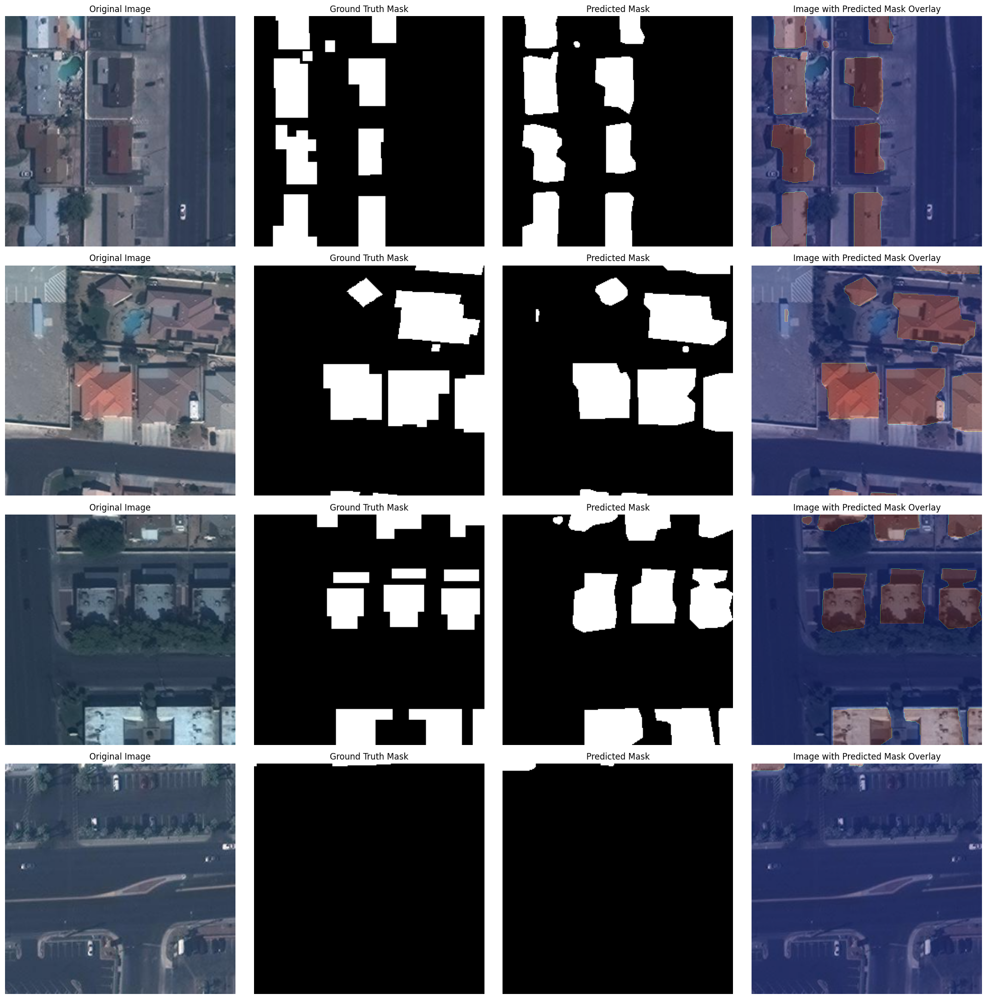

In [ ]:
# Plot specific set of predictions (optionally post-processed)
plot_same_predictions(model, test_loader, device, post_proc=True, num_images=4)

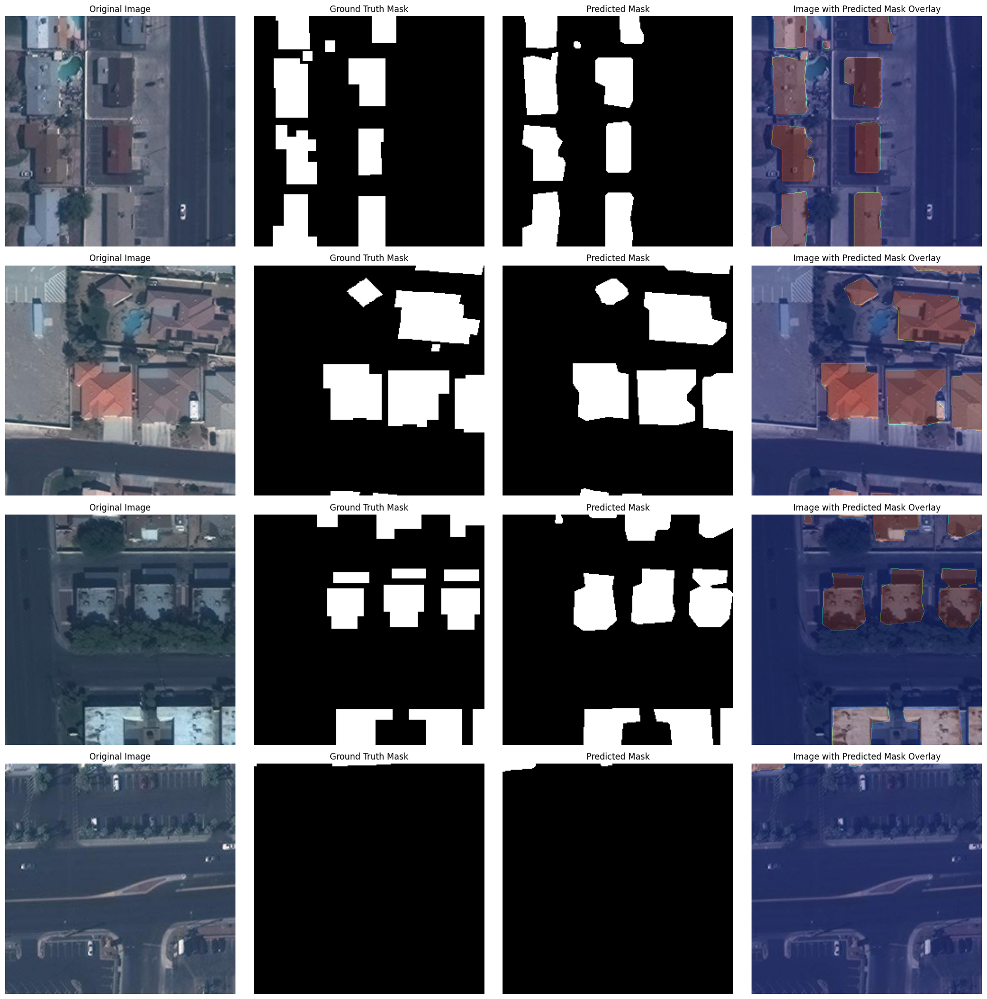

In [ ]:
# Plot specific set of predictions using TTA (and optionally post-processing)
plot_same_predictions_tta(model, test_loader, device, tta_transforms, inverse_tta_transforms, post_proc=True, num_images=4)

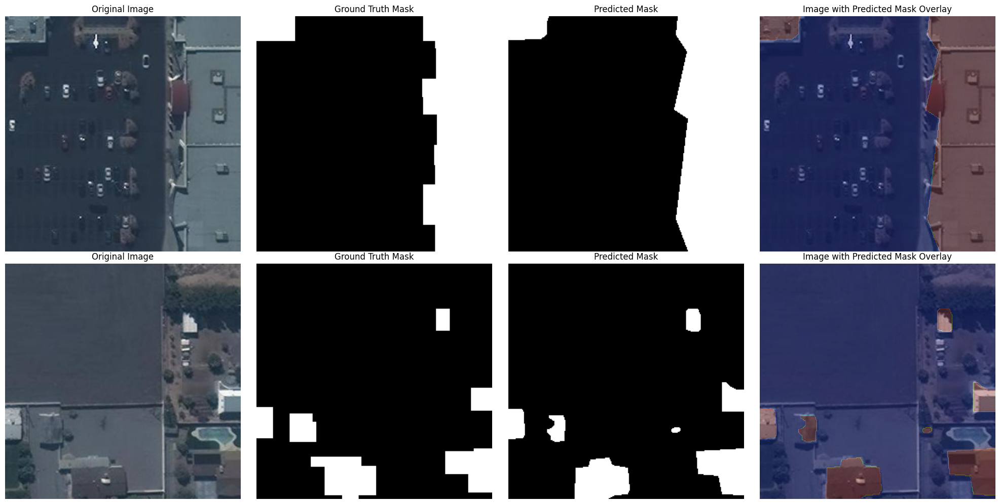

In [ ]:
# Plot random predictions
plot_random_predictions(model, test_loader, device, post_proc=True, num_images=2)